In [17]:
import os

# Print the current working directory
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")


Current working directory: c:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\benchmark


In [27]:
import os

# Define the path (make sure to use raw strings or double backslashes for Windows)
path_to_check = r"C:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\benchmark\checkpoints\reduced_graph\hydro"

# Check if the path exists
if os.path.exists(path_to_check):
    print(f"✅ The path exists: {path_to_check}")
else:
    print(f"❌ The path does NOT exist: {path_to_check}")


✅ The path exists: C:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\benchmark\checkpoints\reduced_graph\hydro


C:\Users\Scail.WINDOWS-4FTU4OO\AppData\Local\Temp\ipykernel_21476\4117862631.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  feat_syn = torch.load(feat_path, map_locat

Plotting graph with 61 nodes and 1830 edges...
✅ Graph plot saved to C:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\Graph_Drawing\hydro_jc_photo_plot.png


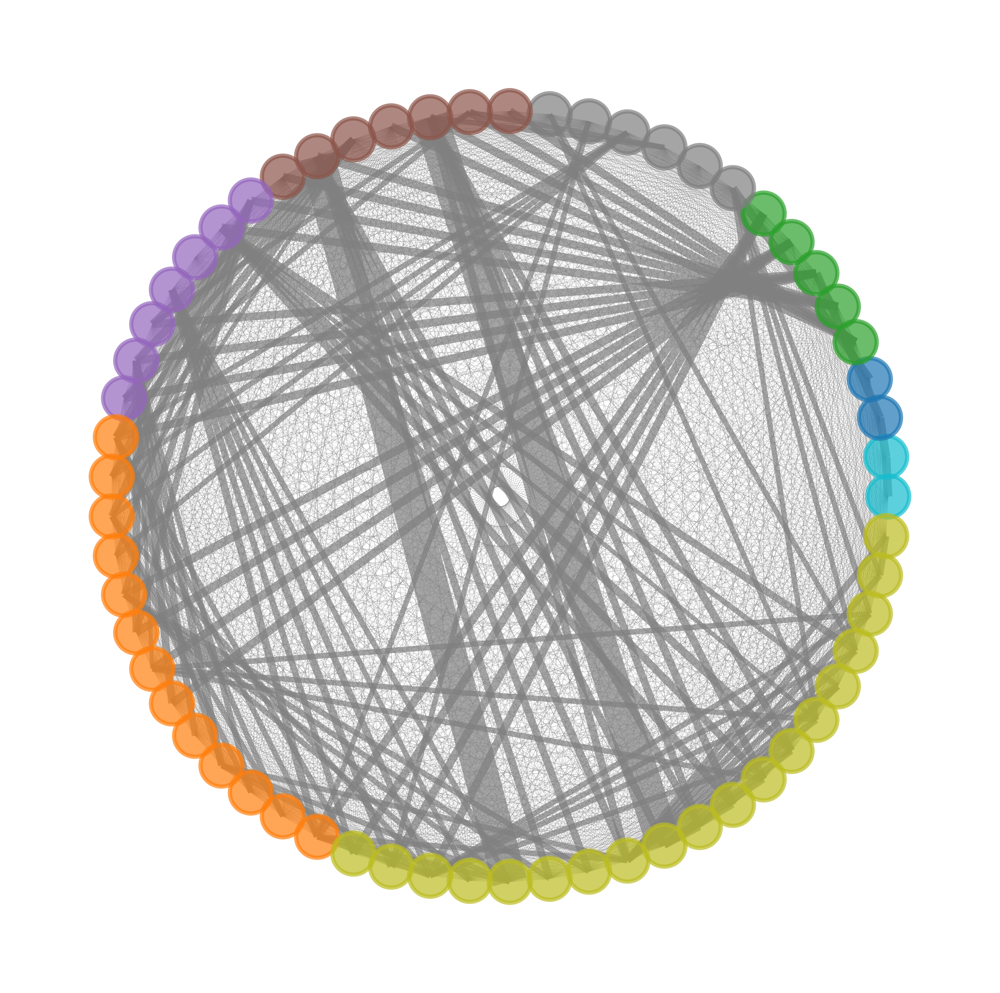

In [20]:
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.utils import to_networkx
from torch_geometric.data import Data
import os
import numpy as np

# Function to plot and save the graph with edge width based on actual weights
def plot_graph(method,G, labels, adj_syn, save_path, figsize=(4, 4), dpi=1000):
    print(f"Plotting graph with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges...")

    # **Choose layout based on graph size**
    if G.number_of_nodes() > 5000:
        pos = nx.spring_layout(G, seed=42, k=0.1)  # Faster for large graphs
    else:
        pos = nx.circular_layout(G)  # More structured for smaller graphs

    plt.figure(figsize=figsize, dpi=dpi)

    # Assign colors based on node labels
    unique_labels = np.unique(labels)
    color_map = plt.cm.get_cmap('tab10', len(unique_labels))  # Use tab10 colormap

    # Create a color list for nodes
    node_colors = [color_map(label.item()) for label in labels]



    # **Edge widths based on actual weights (adj_syn)**
    # Extract the non-zero weights from adj_syn
    edge_weights = adj_syn[adj_syn != 0].cpu().numpy()  # Convert non-zero edge weights to numpy array

    # **Normalize the weights**
    max_weight = max(edge_weights) if edge_weights.size > 0 else 1  # Get max weight for normalization
    edge_widths = edge_weights / max_weight *2    # Scale the edge width (multiply by a factor for better visibility)
    # **Condition to enlarge edge widths smaller than 0.5**
    # edge_widths = np.where(edge_widths < 0.1, edge_widths * 2, edge_widths)
    if method in ['hydro','hydro_jc']:
        edge_widths = np.where(edge_widths < 0.5, edge_widths * 200, edge_widths)
    
    elif method in ['sgdd']:
        edge_widths = np.where(edge_widths < 0.1, edge_widths * 5, edge_widths)
    
    else:
        edge_widths = np.where(edge_widths < 0.1, edge_widths * 5, edge_widths)

            
    
    # if edge_widths<0.5:
    #     edge_widths = edge_widths *3
    # if edge_widths

    # # **Ensure a minimum edge width** (e.g., minimum value of 0.5 for visibility)
    # min_edge_width = 0.5
    # edge_widths = np.clip(edge_widths, min_edge_width, None)  # Clip the values to ensure minimum width


    # Draw nodes with colors based on their labels
    nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.7)

    # Draw edges with width scaled by actual edge weights
    edge_list = list(G.edges())
    nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='gray', alpha=0.7)

    # # Add title and remove axis
    # plt.title(f"Graph Visualization ({os.path.basename(save_path)})", fontsize=16, fontweight='bold')
    plt.axis('off')  # Hide axes for cleaner look
    
    # Save the figure with high DPI
    plt.savefig(save_path, format='PNG', bbox_inches='tight', dpi=dpi)
    # plt.show()
    print(f"✅ Graph plot saved to {save_path}")


# Ensure the directory exists for saving the plot
graph_dir = r"C:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\Graph_Drawing"
os.makedirs(graph_dir, exist_ok=True)

# Example data (replace this with your actual graph data)
# methods = ['hydro','gcond','gdem','sgdd','hydro_jc']
methods = ['hydro_jc']
reduction_rates = [0.01]  # Ensure these match your file names
dataset = 'photo'  # Dataset name
seed = 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Path to saved graphs
save_base_path = r"C:\Users\Scail.WINDOWS-4FTU4OO\Desktop\IJCAI\GraphSlim\benchmark\checkpoints\reduced_graph"

# Loop through each method and reduction rate
for method in methods:
    for reduction_rate in reduction_rates:
        # Construct the path to synthetic data
        feat_path = os.path.join(save_base_path, f"{method}\\feat_{dataset}_{reduction_rate}_{seed}.pt")
        label_path = os.path.join(save_base_path, f"{method}\label_{dataset}_{reduction_rate}_{seed}.pt")
        adj_path = os.path.join(save_base_path, f"{method}\\adj_{dataset}_{reduction_rate}_{seed}.pt")

        # Check if the files exist
        # if not (os.path.exists(feat_path) and os.path.exists(label_path) and os.path.exists(adj_path)):
        #     print(f"⚠️ Skipping {method} with reduction {reduction_rate}: Files not found.")
        #     continue  # Skip missing files

        # Load synthetic graph data
        feat_syn = torch.load(feat_path, map_location=device)
        labels_syn = torch.load(label_path, map_location=device)
        adj_syn = torch.load(adj_path, map_location=device)

        # Create a new PyG Data object
        synthetic_data = Data(x=feat_syn, edge_index=adj_syn.nonzero().t(), y=labels_syn)

        # Convert to NetworkX graph
        G = to_networkx(synthetic_data, to_undirected=True)

        # Define save path for the graph plot
        save_plot_path = os.path.join(graph_dir, f"{method}_{dataset}_plot.png")


        # Plot and save the graph
        plot_graph(method,G, labels_syn, adj_syn, save_path=save_plot_path)
 

In [1]:
import pandas as pd 
df = pd.read_csv('Final_markline.csv')
df

,RecNo,ID,CompanyName,Suppliers,company_country,supplier_country
0,1,1,Hamenz For German Tech. Ind. (S.A.E.),General Motors (GM),Egypt,United States
1,2,6,Alexandria Automotive Casting Co. S.A.E.,Volkswagen,Egypt,Germany
2,3,6,Alexandria Automotive Casting Co. S.A.E.,Opel,Egypt,Germany
3,4,6,Alexandria Automotive Casting Co. S.A.E.,Land Rover,Egypt,United Kingdom
4,5,6,Alexandria Automotive Casting Co. S.A.E.,Mercedes-Benz,Egypt,Sweden
...,...,...,...,...,...,...
89424,89845,40900,"Ningbo Goodtime SCI & Tech Co., Ltd.",Ford Lio Ho Motor,China,Taiwan
89425,89846,40900,"Ningbo Goodtime SCI & Tech Co., Ltd.",Chrysler,China,United States
89426,89847,40900,"Ningbo Goodtime SCI & Tech Co., Ltd.",Toyota,China,Japan
89427,89848,40900,"Ningbo Goodtime SCI & Tech Co., Ltd.",Honda,China,Japan


In [3]:
import pandas as pd  

# Read the CSV file  
df = pd.read_csv('Final_markline.csv')  

# Get unique values from both columns  
unique_company_countries = df["company_country"].dropna().unique()  
unique_supplier_countries = df["supplier_country"].dropna().unique()  

# Combine both sets and get unique values  
all_unique_countries = set(unique_company_countries) | set(unique_supplier_countries)  

# Print the result  
print(f"Total unique countries: {len(all_unique_countries)}")  
print(all_unique_countries)


Total unique countries: 76
{'France', 'Mexico', 'Germany', 'Spain ', 'China', 'Belgium ', 'Vietnam', 'Pakistan', 'United Kingdom', 'United States ', 'Brazil', 'South Africa', 'United States', 'Ecuador', 'Slovenia', 'Netherlands', 'Argentina', 'Belgium', 'Russia', 'Finland', 'Norway', 'Sweden ', 'Egypt', 'Malta', 'Bulgaria', 'Europe (EU)', 'Switzerland', 'Czech Republic', 'China ', 'Morocco', 'Romania', 'Japan ', 'Venezuela', 'Hong Kong', 'South Korea', 'Ukraine', 'Korea', 'Indonesia', 'Croatia', 'Hungary', 'India', 'Germany (BMW), United Kingdom (Rover)', 'Luxembourg', 'Slovakia', 'U.S.A.', 'Japan', 'Tunisia', 'Taiwan', 'Malaysia', 'South Korean', 'Portugal', 'DAELIM motor Co., Ltd.', 'Ireland', 'Japn', 'Australia', 'Turkey', 'Canada', 'Philippines', 'Uzbekistan', 'Serbia', 'Italy', 'Monaco', 'Spain', 'Sweden', 'Singapore', 'Israel', 'Iseral', 'Iran', 'Denmark', 'Belarus', 'UK', 'Jordan', 'Poland', 'Colombia', 'Thailand', 'Austria'}


In [7]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('Final_markline.csv')

# Predefined mapping of countries to continents
country_to_continent = {
    "Africa": ["South Africa", "Egypt", "Nigeria", "Kenya", "Morocco", "Ghana", "Algeria", "Ethiopia", "Tunisia", "Uganda", "Zimbabwe"],
    "Asia": ["China", "India", "Japan", "South Korea", "Indonesia", "Pakistan", "Vietnam", "Thailand", "Malaysia", "Singapore", "Philippines", "Israel", "Iran", "Saudi Arabia", "Turkey", "Uzbekistan", "Sri Lanka", "Jordan", "Taiwan", "South Korean", "Hong Kong", "Korea", "Bangladesh", "Iraq", "Lebanon", "Syria", "Qatar"],
    "Europe": ["France", "Germany", "Italy", "Spain", "United Kingdom", "Russia", "Netherlands", "Belgium", "Sweden", "Switzerland", "Austria", "Poland", "Portugal", "Denmark", "Norway", "Finland", "Ukraine", "Romania", "Bulgaria", "Ireland", "Czech Republic", "Slovakia", "Slovenia", "Luxembourg", "Monaco", "Croatia", "Serbia", "Slovakia", "Estonia", "Latvia", "Lithuania", "Hungary", "Malta", "Kosovo", "Cyprus", "Belarus", "Moldova", "Georgia", "Armenia"],
    "North America": ["United States", "Canada", "Mexico", "Cuba", "Guatemala", "Honduras", "Panama", "Costa Rica", "Jamaica", "Trinidad and Tobago", "Bahamas", "Barbados", "Belize"],
    "South America": ["Brazil", "Argentina", "Colombia", "Chile", "Peru", "Venezuela", "Ecuador", "Bolivia", "Paraguay", "Uruguay", "Suriname", "Guyana", "French Guiana"],
    "Oceania": ["Australia", "New Zealand", "Papua New Guinea", "Fiji", "Solomon Islands", "Vanuatu", "Samoa", "Tonga", "Kiribati", "Tuvalu", "Nauru", "Palau", "Marshall Islands", "Micronesia", "Northern Mariana Islands", "American Samoa"],
    "Antarctica": ["Antarctica"]  # Just for completeness, no countries are based here
}

# Reverse the mapping to get a country -> continent map
country_to_continent_reverse = {country: continent for continent, countries in country_to_continent.items() for country in countries}

# Function to map countries to their continents
def map_country_to_continent(country):
    country = country.strip()  # Remove extra spaces
    return country_to_continent_reverse.get(country, 'Unknown')  # Default to 'Unknown' if not found

# Map the 'company_country' and 'supplier_country' columns to continents
df['company_country'] = df['company_country'].apply(map_country_to_continent)
df['supplier_country'] = df['supplier_country'].apply(map_country_to_continent)

# Save the modified dataframe to a new CSV
df.to_csv('Final_markline_with_regions.csv', index=False)

print("Countries in 'company_country' and 'supplier_country' columns have been replaced with continent names.")


Countries in 'company_country' and 'supplier_country' columns have been replaced with continent names.


In [8]:
import pandas as pd 
df = pd.read_csv('filtered_label_pp_dep_2019_2021.csv')
df

,ITO_j,ITO_i,f_ij,f_i,f_j,f,odds,pr_norm,link01,nr_contributors,ITO_j_Name,ITO_i_Name
0,101111,101112,24,3153,86,219476,19.425663,0.902084,1,271158,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled carcases; Fresh or chilled ha...
1,101111,101132,4,24,86,219476,425.341085,0.995309,1,2064,Fresh or chilled carcases; Fresh or chilled cu...,"Frozen carcases and half-; Frozen hams, should..."
2,101111,101139,4,508,86,219476,20.094854,0.905190,1,43688,Fresh or chilled carcases; Fresh or chilled cu...,"Edible offal of bovine an; Fresh, chilled or f..."
3,101111,101150,3,51,86,219476,150.120383,0.986766,1,4386,Fresh or chilled carcases; Fresh or chilled cu...,Pig fat free of lean meat; Lard and other pig ...
4,101111,101210,5,1924,86,219476,6.632138,0.737950,1,165464,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled whole ch; Fresh or chilled wh...
...,...,...,...,...,...,...,...,...,...,...,...,...
18908,332060,332050,10,487,625,219476,7.210710,0.756416,1,304375,Design and assembly of in,Installation of electric ; Installation of ele...
18909,332070,212013,4,982,14,219476,63.856852,0.969163,1,13748,Installation of industria,Medicaments of alkaloids ; Other medicaments f...
18910,332070,282512,3,220,14,219476,213.775325,0.990688,1,3080,Installation of industria,Window or wall air condit; Air conditioning ma...
18911,332070,293220,4,1602,14,219476,39.143214,0.950178,1,22428,Installation of industria,Safety seat belts; Airbags with inflator sys; ...


In [9]:
# Create new columns keeping the first two digits
df['ITO_j2'] = df['ITO_j'].astype(str).str[:2]
df['ITO_i2'] = df['ITO_i'].astype(str).str[:2]

# Print the modified DataFrame
df

,ITO_j,ITO_i,f_ij,f_i,f_j,f,odds,pr_norm,link01,nr_contributors,ITO_j_Name,ITO_i_Name,ITO_j2,ITO_i2
0,101111,101112,24,3153,86,219476,19.425663,0.902084,1,271158,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled carcases; Fresh or chilled ha...,10,10
1,101111,101132,4,24,86,219476,425.341085,0.995309,1,2064,Fresh or chilled carcases; Fresh or chilled cu...,"Frozen carcases and half-; Frozen hams, should...",10,10
2,101111,101139,4,508,86,219476,20.094854,0.905190,1,43688,Fresh or chilled carcases; Fresh or chilled cu...,"Edible offal of bovine an; Fresh, chilled or f...",10,10
3,101111,101150,3,51,86,219476,150.120383,0.986766,1,4386,Fresh or chilled carcases; Fresh or chilled cu...,Pig fat free of lean meat; Lard and other pig ...,10,10
4,101111,101210,5,1924,86,219476,6.632138,0.737950,1,165464,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled whole ch; Fresh or chilled wh...,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18908,332060,332050,10,487,625,219476,7.210710,0.756416,1,304375,Design and assembly of in,Installation of electric ; Installation of ele...,33,33
18909,332070,212013,4,982,14,219476,63.856852,0.969163,1,13748,Installation of industria,Medicaments of alkaloids ; Other medicaments f...,33,21
18910,332070,282512,3,220,14,219476,213.775325,0.990688,1,3080,Installation of industria,Window or wall air condit; Air conditioning ma...,33,28
18911,332070,293220,4,1602,14,219476,39.143214,0.950178,1,22428,Installation of industria,Safety seat belts; Airbags with inflator sys; ...,33,29


In [26]:
import pandas as pd  

# Read the CSV file  


# Get unique values from both columns  
unique_company_countries = df["ITO_j2"].dropna().unique()  
unique_supplier_countries = df["ITO_i2"].dropna().unique()  

# Combine both sets and get unique values  
all_unique_countries = set(unique_company_countries) | set(unique_supplier_countries)  

# Print the result  
print(f"Total unique countries: {len(all_unique_countries)}")  
print(all_unique_countries)


Total unique countries: 24
{'16', '29', '28', '32', '11', '19', '22', '31', '17', '12', '20', '13', '25', '23', '33', '21', '15', '26', '14', '30', '10', '24', '18', '27'}


In [35]:
# Define a function to map values to the ranges
def map_to_range(value):
    if 10 <= value <= 15:
        return 0
    elif 15 < value < 20:
        return 1
    elif 20 <= value <= 23:
        return 2
    elif 24 <= value <= 25:
        return 3
    elif 26 <= value <= 29:
        return 4
    elif 30 <= value <= 33:
        return 5
  
    return None  # For values outside the range

# Apply the function to both columns
df['ITO_j_range'] = df['ITO_j2'].astype(int).apply(map_to_range)
df['ITO_i_range'] = df['ITO_i2'].astype(int).apply(map_to_range)
df


,ITO_j,ITO_i,f_ij,f_i,f_j,f,odds,pr_norm,link01,nr_contributors,ITO_j_Name,ITO_i_Name,ITO_j2,ITO_i2,ITO_j_range,ITO_i_range
0,101111,101112,24,3153,86,219476,19.425663,0.902084,1,271158,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled carcases; Fresh or chilled ha...,10,10,0,0
1,101111,101132,4,24,86,219476,425.341085,0.995309,1,2064,Fresh or chilled carcases; Fresh or chilled cu...,"Frozen carcases and half-; Frozen hams, should...",10,10,0,0
2,101111,101139,4,508,86,219476,20.094854,0.905190,1,43688,Fresh or chilled carcases; Fresh or chilled cu...,"Edible offal of bovine an; Fresh, chilled or f...",10,10,0,0
3,101111,101150,3,51,86,219476,150.120383,0.986766,1,4386,Fresh or chilled carcases; Fresh or chilled cu...,Pig fat free of lean meat; Lard and other pig ...,10,10,0,0
4,101111,101210,5,1924,86,219476,6.632138,0.737950,1,165464,Fresh or chilled carcases; Fresh or chilled cu...,Fresh or chilled whole ch; Fresh or chilled wh...,10,10,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18908,332060,332050,10,487,625,219476,7.210710,0.756416,1,304375,Design and assembly of in,Installation of electric ; Installation of ele...,33,33,5,5
18909,332070,212013,4,982,14,219476,63.856852,0.969163,1,13748,Installation of industria,Medicaments of alkaloids ; Other medicaments f...,33,21,5,2
18910,332070,282512,3,220,14,219476,213.775325,0.990688,1,3080,Installation of industria,Window or wall air condit; Air conditioning ma...,33,28,5,4
18911,332070,293220,4,1602,14,219476,39.143214,0.950178,1,22428,Installation of industria,Safety seat belts; Airbags with inflator sys; ...,33,29,5,4


In [36]:
# Calculate unique values and their counts for 'ITO_j_range' and 'ITO_i_range'
ito_j_counts = df['ITO_j_range'].value_counts()
ito_i_counts = df['ITO_i_range'].value_counts()

# Print the results
print("ITO_j_range unique value counts:")
print(ito_j_counts)
print("\nITO_i_range unique value counts:")
print(ito_i_counts)

ITO_j_range unique value counts:
ITO_j_range
2    3914
4    3645
5    3389
3    3360
1    2398
0    2207
Name: count, dtype: int64

ITO_i_range unique value counts:
ITO_i_range
4    4998
0    3724
2    3575
5    2665
3    2494
1    1457
Name: count, dtype: int64


In [37]:
df.to_csv('product_hungry.csv')